# Create a word2vec model

For this assignment, we will use Pytorch to create a word2vec model that infers numerical vectors for words that capture their meaning. Word2vec was first introduced in 2013 by Mikolov et al. at Google. Their paper can be found [here](https://arxiv.org/pdf/1301.3781.pdf), though you do not need to read and understand it in order to implement the model. It is a very popular machine learning model that has been implemented to capture the meaning of text for many real world cases. 

This [blog post](https://blog.acolyer.org/2016/04/21/the-amazing-power-of-word-vectors/) is a great overview of word2vec. Please read it carefully before you create the word2vec model for this assignment. Specifically, you will build a "Continuous Bag-of-Words Model (CBOW)" word2vec model. CBOW predicts a focal (target) word from its context (the words surround it). The following Youtube videos also explain the concept of the CBOW model.
- https://www.youtube.com/watch?v=UqRCEmrv1gQ
- https://www.youtube.com/watch?v=gQddtTdmG_8 


<img src="https://analyticsindiamag.com/wp-content/uploads/2020/09/q.png">

[CBOW structure from https://analyticsindiamag.com/the-continuous-bag-of-words-cbow-model-in-nlp-hands-on-implementation-with-codes/]

Your task is to create a CBOW neural network model class called `CBOW`. `CBOW` has the structure shown above and the following properties:

- `vocab_size` - Size of vocabulary($V$). Note that vocabulary is a set of unique words in a corpus (a bunch of text documents).
- `embed_dim` - Dimension of the embedding vector
- `window_size` - Size of window. If a focal word is at position $t$, then the CBOW model uses embedding vectors of words between ($t$-window_size) and ($t$+window_size) to predict the focal word
- `hidden_dim` - Dimension of the hidden layer ($N$)

`CBOW` consists of three layers:

- `embedding` - An embedding layer that is initialized with `torch.nn.Embedding`
- `fc1` - A linear transformation that connects the embedding layer to the hidden layer. `torch.nn.functional.relu` activation should be applied to the output of `fc1`.
- `fc2` - A linear transformation that connects the activation of `fc1` to a tensor of length `vocab_size`. 

The training data (i.e., the features `X`, the labels `y`) that we will use to train the `CBOW` model will be:
- `X` will be a tensor of length (2 * `window_size`) containing the indices of all words in the window before and after the focal word. 
- `y`, (the label that our model is trying to predict) should be a list containing the index of the focal word.

Note that a single review in our data will produce multiple items of training data. For example, suppose a single review is:

 "the food was not good at all"
 
 If our `window_size` = 2, then this would generate the following (context, focal_word) training data tuples:

```python
(['the','food','not','good'], ['was']) # 'was' is the focal word
(['food','was','good','at'], ['not']) # 'not' is the focal word
(['was','not','at','all'],['good']) # 'good' is the focal word
```

However, we can't directly use these tuples to train our model. First we have to replace each word with a unique integer (its index) and then convert these to pytorch tensors. Note that, we will be using a special embedding layer (`torch.nn.Embedding`) which will convert these indexes to the one-hot vectors that are described in the videos.

To get tensors from the original data, you will need to:

- Create a list (or `set`) of all unique words in the cleaned text, called `vocab`.
- Create a dictionary called `word_to_index` where the key is a word and the value is the index of a word (a unique number for each word). You will have to figure out how to create this dictionary from the cleaned dataset.
- Write a function `make_cbow_data` that accepts a single review from cleaned_text as an input and outputs a **list of tuples** where:
 -  the first part of the tuple contains a tensor of the indices of words in the window before and after each focal word
 - the second part of the tuple is a tensor containing the index of the focal word.
 - The dtype of both tensors in the tuple should be `torch.long`.
 - You will have to figure out how to create multiple tuples of tensors from a single review (an item from `cleaned_text`) using loops 


We will use restaurant customer reviews data for this assignment.

**Do not change the code block below**. Below is a function that cleans up the text of a review and returns a list of all the words in the review.

You will use `cleaned_text`, which is defined below, to create a training dataset for your `CBOW` model.

In [1]:
from google.colab import files

files.upload()
files.upload()

Saving text.csv to text.csv


Saving Word2VecSupport.py to Word2VecSupport.py


{'Word2VecSupport.py': b'# -*- coding: utf-8 -*-\r\n"""\r\nCreated on Thu Nov 18 19:09:29 2021\r\nECE:5450 Word2Vec Project: Word2Vec Class\r\n@author: wangy\r\n"""\r\nimport torch\r\n\r\nclass Word2Vec:\r\n    def __init__(self, vocabList):\r\n        self.vocabList = vocabList\r\n        # create a dictionary \r\n        # where the key is a word and the value is the index of a word \r\n        # (a unique number for each word)\r\n        self.word_to_index_dictionary = {self.vocabList[i]: i for i in range(len(self.vocabList))}\r\n    \r\n    \'\'\'\r\n    Define make_cbow_data() function. \r\n    It should take text (text of a single review) as an argument,\r\n    and window_size (the number of words to the left or right of the focal word)\r\n    as an argument. \r\n    It also take word_to_index dictionary. \r\n    It should return a list of tuples as described in the description.\r\n    \'\'\'\r\n    def make_cbow_data(self, text, window_size, word_to_index):\r\n        \r\n      

In [14]:
# DO NOT CHANGE THIS CODEBLOCK
import pandas as pd
import string
import Word2VecSupport
import numpy as np

def clean_text(text):    
    x = text.translate(str.maketrans('', '', string.punctuation)) # remove punctuation
    x = x.lower().split() # lower case and split by whitespace to differentiate words
    return x

example_text = pd.read_csv('text.csv')
cleaned_text = example_text.Review[:100].apply(clean_text)

### Data Description
Here, the `example_text` has 1000 pieces of text message. The first 5 pieces of message are shown in the following.

Since there exist punctuation in `example_text`, we use `cleaned_text` function to remove them and also set all words to lower case and split them ny whitespace.

In [15]:
print(example_text.count())
example_text.head()

Review    1000
dtype: int64


,Review
0,Wow... Loved this place.
1,Crust is not good.
2,Not tasty and the texture was just nasty.
3,Stopped by during the late May bank holiday of...
4,The selection on the menu was great and so wer...


In [16]:
cleaned_text.head()

0                            [wow, loved, this, place]
1                               [crust, is, not, good]
2    [not, tasty, and, the, texture, was, just, nasty]
3    [stopped, by, during, the, late, may, bank, ho...
4    [the, selection, on, the, menu, was, great, an...
Name: Review, dtype: object

### Create a CBOW Class

The first step is to create `vocab` and `word_to_index` according to the instructions above.

Here, to create unique vocabulary, each word in `cleaned_text` was checked through nested for loops and the `set()` function was used to delete redundant words.

The resulting `vocab` has a size of 483, which means there is in total 483 unique words in `cleaned_text`. 

`word_to_index` was a dictionary created to give all 483 words an index number.

You can click the variables explorer to find more details about `word_to_index` and `vocab`.

In [17]:
#Create your vocab here
intermid = []
print(cleaned_text)
for i in range(len(cleaned_text)):
    for j in range(len(cleaned_text[i])):
        intermid.append(cleaned_text[i][j])
vocab = set(intermid)

#Create your word_to_index dictionary here
vocab = list(vocab)

# Create word2Vec from the supporting class
word2Vec = Word2VecSupport.Word2Vec(vocab)


0                             [wow, loved, this, place]
1                                [crust, is, not, good]
2     [not, tasty, and, the, texture, was, just, nasty]
3     [stopped, by, during, the, late, may, bank, ho...
4     [the, selection, on, the, menu, was, great, an...
                            ...                        
95                             [well, never, go, again]
96                              [will, be, back, again]
97                             [food, arrived, quickly]
98                                 [it, was, not, good]
99    [on, the, up, side, their, cafe, serves, reall...
Name: Review, Length: 100, dtype: object


In [6]:
cleaned_text[0]

['wow', 'loved', 'this', 'place']

In [18]:
word2Vec.make_cbow_data(['the', 'food', 'was', 'not', 'good', 'at', 'all'], 2, word2Vec.word_to_index_dictionary)


[(tensor([171,  30, 236, 389]), tensor([36])),
 (tensor([ 30,  36, 389, 192]), tensor([236])),
 (tensor([ 36, 236, 192, 329]), tensor([389]))]

In [19]:
word2Vec.word_to_index_dictionary


{'10': 326,
 '2': 333,
 '23': 223,
 '30': 211,
 '4': 354,
 '5': 93,
 'a': 424,
 'about': 407,
 'above': 332,
 'absolutely': 184,
 'accident': 160,
 'after': 51,
 'again': 130,
 'ahead': 44,
 'all': 329,
 'alone': 209,
 'also': 178,
 'always': 195,
 'am': 410,
 'amazing': 344,
 'amount': 433,
 'ample': 198,
 'an': 155,
 'and': 149,
 'angry': 4,
 'any': 264,
 'appalling': 80,
 'apparently': 279,
 'appetizers': 250,
 'are': 96,
 'around': 360,
 'arrived': 366,
 'as': 151,
 'ask': 14,
 'at': 192,
 'attack': 104,
 'attentive': 427,
 'attitudes': 168,
 'back': 377,
 'bad': 311,
 'banana': 82,
 'bank': 441,
 'batter': 177,
 'be': 363,
 'beautiful': 341,
 'because': 8,
 'beef': 281,
 'been': 98,
 'beer': 194,
 'before': 162,
 'behind': 15,
 'being': 300,
 'best': 323,
 'beyond': 431,
 'bite': 88,
 'blah': 380,
 'bland': 240,
 'blow': 161,
 'both': 397,
 'bottom': 143,
 'break': 190,
 'breakfast': 145,
 'buffet': 282,
 'burger': 61,
 'burrittos': 403,
 'but': 276,
 'by': 299,
 'bye': 108,
 'caf

Now define your CBOW model class.

In [72]:
# Define your CBOW model here (TODO)
import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable

class CBOW(nn.Module):

   
  def __init__(self,inSize,outSize,num_embeddings,embedding_dim):
      super().__init__()

      self.fc1 = nn.Linear(num_embeddings,embedding_dim)
      #483 by 100 i think
      self.relu1 = nn.ReLU()
      self.embedding=nn.Embedding(inSize,num_embeddings)

      self.out = nn.Linear(embedding_dim,outSize)
      #30 back to 483 i think
      self.out_act = nn.Sigmoid()
    
  def forward(self, X):
        X = self.embedding(X)
        X = sum(X).view(1, -1)
        a1 = self.fc1(X)
        h1 = self.relu1(a1)
        a3 = self.out(h1)
        y = self.out_act(a3)
        return y
        #a1 into X  here or h1
        
        # x changes to 30
        #30
        
        #
      #  y = self.out_act(a3)
       # return y
        
X1 = torch.randn(1000, 483)
X2 = torch.randn(1000, 483) + 1.5
X = torch.cat([X1, X2], dim=0)
Y1 = torch.zeros(1000, 1)
Y2 = torch.ones(1000, 1)
Y = torch.cat([Y1, Y2], dim=0)

## Train the CBOW model

Now that your model class is written, you must create an instance of the model and train it using the loss function `torch.nn.CrossEntropyLoss` on the output of `fc2` and `y` (the labels).

Train your CBOW model for 300 epochs with `embed_dim`= 100, `window_size`=2, and `hidden_dim`=30. 
- Do not split the data into training and test sets (we will not be evaluating the performance of this model). 
- Use the SGD optimizer with learning rate = 0.001.
- Append the loss at every epoch to a list (return the list if you use a function to fit your model), so that we can plot it later. 

In [73]:
# Parameters
VOCAB_SIZE = len(vocab)
EMBED_DIM = 100
WINDOW_SIZE = 2
HIDDEN_DIM = 30
N_EPOCHS = 300

# Construct input data
data = word2Vec.createTupleList(cleaned_text, WINDOW_SIZE, word2Vec.word_to_index_dictionary)

# Train your CBOW model here (TODO)
def train_epoch(model, opt, criterion, batch_size=50):
    model.train()
    losses = []
    for x,y in data:

        opt.zero_grad()
        # (1) Forward
        y_hat = net(x)
        # (2) Compute diff
        loss = criterion(y_hat,y)
        # (3) Compute gradients
        loss.backward()
        # (4) update weights
        opt.step()        
        losses.append(loss.data.numpy())

    return losses

net = CBOW(VOCAB_SIZE,VOCAB_SIZE,EMBED_DIM,HIDDEN_DIM)
opt = optim.Adam(net.parameters(), lr=0.001, betas=(0.9, 0.999))
criterion = nn.CrossEntropyLoss()
e_losses = []
for e in range(N_EPOCHS):
    e_losses += train_epoch(net, opt, criterion)
    if e % 10==0:
      print(e,e_losses)

0 [array(6.2558765, dtype=float32), array(6.165988, dtype=float32), array(6.173957, dtype=float32), array(6.2649255, dtype=float32), array(6.2251062, dtype=float32), array(6.272724, dtype=float32), array(6.4234085, dtype=float32), array(6.031338, dtype=float32), array(6.3179016, dtype=float32), array(6.130616, dtype=float32), array(6.1455865, dtype=float32), array(6.389189, dtype=float32), array(6.377548, dtype=float32), array(6.30519, dtype=float32), array(6.08208, dtype=float32), array(6.1122947, dtype=float32), array(5.918327, dtype=float32), array(6.1606684, dtype=float32), array(6.312606, dtype=float32), array(6.3354387, dtype=float32), array(6.0794005, dtype=float32), array(6.0403495, dtype=float32), array(6.314371, dtype=float32), array(6.2144876, dtype=float32), array(6.2290516, dtype=float32), array(6.2823634, dtype=float32), array(6.039119, dtype=float32), array(6.1901584, dtype=float32), array(6.16448, dtype=float32), array(6.018554, dtype=float32), array(6.217899, dtype=flo

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



150 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



160 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



170 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



180 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



190 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



200 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



210 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



220 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



230 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



240 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



250 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



260 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



270 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



280 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



290 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [74]:
data[:5]

[(tensor([236, 347, 171, 331]), tensor([149])),
 (tensor([347, 149, 331,  36]), tensor([171])),
 (tensor([149, 171,  36,  94]), tensor([331])),
 (tensor([171, 331,  94, 257]), tensor([36])),
 (tensor([225, 299, 171,  32]), tensor([470]))]

## Plot losses by epochs (x-axis: epoch, y-axis: loss)

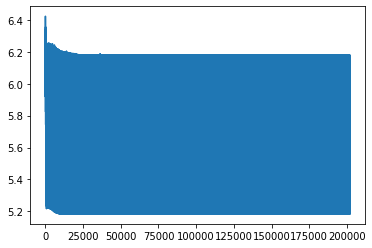

In [75]:
# Insert your code here to plot losses vs epoch (TODO)
import matplotlib.pyplot as plt
plt.plot(e_losses)


## Print five most similar words with the word "delicious"

The whole point of traiing an embedding model is to get an embedding vector for each word. The idea is that the vector somehow captures the meaning of the word. This is useful because data scientists often face scenarios where they must derive meaning from unstructured text data.

Once your model has been trained, you can access the embedding vectors through `model.embedding.weight.data`. You can convert these vectors to a numpy matrix or numpy arrays if needed.

Find the five most similar words with the word "delicious" by calculating cosine similarity between the embedding vector of "delicious" and the embedding vectors of all other words in the vocabulary. 

Hint: cosine similarity is a common metric so you should be able to find one that you can use in an existing library. 

In [76]:
# Insert your code here (TODO)
import sklearn.metrics
values= net.embedding.weight.data
deliciousIdx=word2Vec.word_to_index_dictionary["delicious"]
fiveClosest=[-1]*5
indexes=[None]*5
cos = nn.CosineSimilarity(dim=0, eps=1e-6)
for row in range(len(values)):
  if row != deliciousIdx:
    similarity=torch.cosine_similarity(values[deliciousIdx],values[row],0)
   # print(similarity)
    Min=min(fiveClosest)
    if similarity >Min:
      indexes[fiveClosest.index(Min)]=row
      fiveClosest[fiveClosest.index(Min)]=similarity
newDict= dict((val,key) for key,val in word2Vec.word_to_index_dictionary.items())
print("Closest words in meaning to delicious are: \n")
for key in range(len(indexes)):
  print("'"+newDict[indexes[key]]+"'"," with similarity of ",fiveClosest[key])

Closest words in meaning to delicious are: 

'wonderful'  with similarity of  tensor(0.2540)
'grossed'  with similarity of  tensor(0.2265)
'other'  with similarity of  tensor(0.2756)
'wasting'  with similarity of  tensor(0.2694)
'off'  with similarity of  tensor(0.2189)


While the model learns embedding vectors (that best predict the focal word from its contexts), the vectors that it learns don't seem to truly capture the meaning of words. However, this is mainly due to the small size of our training data. Google trained a word2vec model based on large-scale data (about 100 billion words), and this model captures similarity between words well. You can find the pretrained model at https://code.google.com/archive/p/word2vec/.